# **Examen final de Desarrollo de Aplicaciones para la Visualización de Datos**

Nombre: Jorge 

Apellidos: Bretón de la Cierva

Tiempo: *2 horas y 30 minutos*

## **Contexto del ejercicio**

Un banco portugues desea entender en más detalle las campañas de marketing directo que ha realizado en los últimos meses a más de 40 mil clientes. Las campañas de marketing se basaron en llamadas telefónicas. Muchas veces era necesario más de un contacto con un mismo cliente, para saber si el producto (depósito bancario) sería ('sí') o no ('no') contratado.

El objetivo del análisis es buscar patrones para entender mejor que tipo de perfil tienen los clientes que han contratado el depósito para buscar en su base de datos otros clientes parecidos para aumentar la respuesta y el ROI de futuras campañas de marketing directo intentando vender el mismo depósito. Por lo tanto, se pide:

1.  Realizar un análisis descriptivo de los datos con al menos, 6 visualizaciones diferentes. (3 Puntos) (*)

2.  Montar un dashboard con al menos, 4 visualizaciones diferentes, que incluyan 2 componentes interactivas y 1 callback (5 Puntos) (*)

3. Concluir todo este análisis haciendo recomendaciones para la mejora de futuras campañas de contacto directo a partir de los resultados obtenidos de los análisis realizados con los datos. (2 Puntos)

Para realizar este análisis se provee de un juego de datos con las siguientes variables:

- age	- Edad (numérica)
- job - Ocupación (categórica)
- marital - Estado civil (categórica)
- education - Nivel educativo (categórica)
- default - ¿Tiene algún prestamo en default? (binaria)
- balance - Balance medio anual en euros (numérica)
- housing - ¿Tiene una hipoteca? (binaria)
- loan -  ¿Tiene un prestamo personal? (binaria)
- contact - Tipo de contacto (categórica)
- day_of_week - Último día de la semana que fue contactado (fecha)
- month - Último mes que fue contactado (fecha)
- duration - Duración de la última vez que fue contactado en segundos (entera)
- campaign - Número de veces que fue contactado (numérica)
- pdays - Número de días que pasaron después de que el cliente fue contactado por última vez desde una campaña anterior (numérica; -1 significa que el cliente no fue contactado previamente)
- previous - Número de contactos realizados durante esta campaña y para este cliente (numérica, incluye el último contacto)
- poutcome - Resultado de la campaña de marketing anterior (categórica; 'failure','nonexistent','success')
- y - El cliente ha contratado el depósito (binaria, yes, no)

Recuerda, si tuvieras que programar una función, comenta los argumentos de entrada y salida. **Explica el orden que estás siguiendo a la hora de elegir las visualizaciones y comenta las conclusiones que vas sacando.**


**(*) IMPORTANTE**: Puedes elegir realizar un modelo de clasificación y realizar visualizaciones en torno a ese modelo en los primeros dos apartados. Esta parte no es obligatoria. El objetivo de la clasificación sería predecir si el cliente se suscribirá a un depósito bancario (variable y).








### **Librerías necesarias**

In [35]:
# * Librerias estandar: 
import pandas as pd                 # Para la manipulación de los datasets
import numpy as np                  # Para operaciones matematicas
import sklearn.datasets             # Para los datasets

import plotly.express as px         # Plotly
import plotly.graph_objects as go
import plotly.figure_factory as ff
import pickle                       # Esto sirve para el K-Means Clustering y poder guardar el modelo en el formator correcto. 
from plotly.subplots import make_subplots

# * Librerias de Dash
import dash
import dash_bootstrap_components as dbc
from dash import dcc, html
from dash.dependencies import Input, Output, State

# * Librerías Machine Learning
# * Modelos Existentes (Regresión Lineal, Logistica, Random Forest, K-Means Clustering, SVM)

from sklearn.model_selection import train_test_split 
# ? - Regresión Lineal + Logisticas
from sklearn.linear_model import LinearRegression, SGDClassifier, LogisticRegression
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.svm import SVC
# T-test
from scipy.stats import ttest_ind

# ? - Random Forest (+ Escalamiento necesario)
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler

# ? - Metricas de Precisión
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
    classification_report,
    confusion_matrix,
    silhouette_score
)

from sklearn.pipeline import Pipeline # ? - Para generar modelos de machine learning con escalamiento automatico
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.utils import shuffle
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import OneHotEncoder
from kmodes.kmodes import KModes

# for interactive visualizations
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

### **Análisis descriptivos**

In [173]:
bank_original = pd.read_csv("bank-full.csv", delimiter=";")
bank_df = pd.read_csv("bank-full.csv", delimiter=";")
bank_df.dtypes
bank_df.dropna(inplace=True)
bank_original.dropna(inplace=True)

In [71]:
bank_original

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [159]:
bank_df['job'] = bank_df['job'].astype('category')
bank_df['marital'] = bank_df['marital'].astype('category')
bank_df['education'] = bank_df['education'].astype('category')
bank_df['default'] = bank_df['default'].astype('category')
bank_df['housing'] = bank_df['housing'].astype('category')
bank_df['loan'] = bank_df['loan'].astype('category')
bank_df['day'] = bank_df['day'].astype('category')
bank_df['month'] = bank_df['month'].astype('category')
bank_df['poutcome'] = bank_df['poutcome'].astype('category')
bank_df['y'] = bank_df['y'].astype('category')
bank_df['y_bool'] = bank_df['y'].apply(lambda x: 1 if x == 'yes' else 0)
bank_df['y_bool'] = bank_df['y_bool'].astype('int')

# Convert string columns into dummy variables
string_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'day', 'month', 'poutcome','contact']
bank_df = pd.get_dummies(bank_df, columns=string_columns)

bank_df.dtypes
bank_df


,age,balance,duration,campaign,pdays,previous,y,y_bool,job_admin.,job_blue-collar,...,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,contact_cellular,contact_telephone,contact_unknown
0,58,2143,261,1,-1,0,no,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,44,29,151,1,-1,0,no,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,33,2,76,1,-1,0,no,0,0,0,...,0,0,0,0,0,0,1,0,0,1
3,47,1506,92,1,-1,0,no,0,0,1,...,0,0,0,0,0,0,1,0,0,1
4,33,1,198,1,-1,0,no,0,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,825,977,3,-1,0,yes,1,0,0,...,1,0,0,0,0,0,1,1,0,0
45207,71,1729,456,2,-1,0,yes,1,0,0,...,1,0,0,0,0,0,1,1,0,0
45208,72,5715,1127,5,184,3,yes,1,0,0,...,1,0,0,0,0,1,0,1,0,0
45209,57,668,508,4,-1,0,no,0,0,1,...,1,0,0,0,0,0,1,0,1,0


EDADES

In [116]:
fig = px.histogram(bank_df, x="age", color="y",
                   labels = {"streams": "Reproducciones"},
                   histnorm='probability density',
                   nbins = 100,
                   opacity=0.6)
#fig.update_traces(marker_color = "darkorange")
fig.show()


In [105]:
import plotly.express as px

df = pd.DataFrame()

#job and deposit
df['yes'] = bank_df[bank_df['y'] == 'yes']['job'].value_counts()
df['no'] = bank_df[bank_df['y'] == 'no']['job'].value_counts()

fig = px.bar(df, x=df.index, y=['yes', 'no'], title='Job and deposit')
fig.show()


In [108]:
df_job_success = bank_df[bank_df['y'] == 'yes']['job'].value_counts().reset_index()
df_job_success.columns = ['Job', 'Count']

fig_job_success = px.bar(df_job_success, x='Job', y='Count', title='Job Categories with Highest Success Rate')
fig_job_success.show()


 

In [104]:
fig_marital_deposit = px.histogram(bank_df, x='marital', color='y', barmode='group', title='Estado Civil vs Contratación de Depósitos')
fig_marital_deposit.show()

In [107]:
fig_balance_distribution = px.violin(bank_df, y='balance', color='y', title='Distribución del Balance')
fig_balance_distribution.show()

In [114]:
fig_previous_campaign_outcomes = px.pie(data, names='poutcome', title='Resultados de Campañas Previas')
fig_previous_campaign_outcomes.show()

In [25]:
import plotly.express as px

df_new = bank_df.copy()

# Introduce new column 'age_buckets' to ''
df_new['age_buckets'] = pd.qcut(bank_df['age'], 20, labels=False, duplicates='drop')

# Group by 'age_buckets' and find average campaign outcome per age bucket
mean_age = df_new.groupby(['age_buckets'])['y_bool'].mean().reset_index()

# Plot
fig = px.line(mean_age, x='age_buckets', y='y_bool', title='Mean % subscription depending on age')
fig.update_xaxes(title='Age bucket')
fig.update_yaxes(title='% subscription')
fig.show()


In [26]:
import plotly.express as px

df_new = bank_df.copy()

# Introduce new column 'age_buckets' to ''
#df_new['age_buckets'] = pd.qcut(bank_df['age'], 20, labels=False, duplicates='drop')

# Group by 'age_buckets' and find average campaign outcome per age bucket
mean_age = df_new.groupby(['age'])['y_bool'].mean().reset_index()

# Plot
fig = px.line(mean_age, x='age', y='y_bool', title='Mean % subscription depending on age')
fig.update_xaxes(title='Age bucket')
fig.update_yaxes(title='% subscription')
fig.show()


In [13]:
# Visualización 2: Distribución de Balance (Box Plot)
fig_balance_distribution = px.box(bank_df, y='balance', title='Distribución del Balance')
fig_balance_distribution.show()

In [28]:
fig_education_subscription = px.histogram(bank_df, x='education', color='y', barmode='group', title='Niveles de Educación y Suscripciones')
fig_education_subscription.show()

In [30]:
bank_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,y_bool
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes,1
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes,1
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes,1
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no,0


In [42]:
from scipy.sparse import csc_matrix
data = bank_df.copy()

data = data.replace('unknown', np.nan)
data.dropna(inplace = True)

columns_to_delete = ['age', 'previous', 'default','contact', 'month', 'duration', 'campaign', 'pdays']

X = data.drop(columns_to_delete, axis = 1)

binary_cols = [cname for cname in X.columns if (X[cname].dtype == "object") & (X[cname].nunique() == 2)]
categorical_cols = [cname for cname in X.columns if (X[cname].dtype == "object") & (X[cname].nunique() > 2)]

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_cols)
    ])

# since column names were deleted, I have to put them back using the function
def preprocess_data(X):
    results = pd.DataFrame.sparse.from_spmatrix(preprocessor.fit_transform(X))
    for cname in binary_cols: results[cname] = X.reset_index()[cname].map(dict(yes=1, no=0))
    OH_enc = OneHotEncoder()
    encoded_cols = list(OH_enc.fit(X[categorical_cols]).get_feature_names()) + binary_cols
    results.columns = encoded_cols
    return csc_matrix(results)  # Convert results to a sparse matrix


In [43]:
preprocessed_X = preprocess_data(X)
preprocessed_X

AttributeError: 'numpy.ndarray' object has no attribute 'tocsc'

In [41]:
# Using elbow method to choose number of clusters
wcss = []
for i in range(1, 11):
    km = KModes(n_clusters=i, init='Cao', n_init=5, random_state = 0)
    km.fit(preprocessed_X)
    wcss.append(km.cost_)
    
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

NameError: name 'preprocessed_X' is not defined

In [44]:
fig_previous_campaign_outcomes = px.pie(data, names='poutcome', title='Resultados de Campañas Previas')
fig_previous_campaign_outcomes.show()

In [57]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


# Split the data into training and testing sets
X = bank_df.drop(['y', 'y_bool'], axis=1)
y = bank_df['y_bool']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy and print classification report
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))

# Visualize the confusion matrix
cm = confusion_matrix(y_test, y_pred)
fig = px.imshow(cm, labels=dict(x="Predicted", y="Actual", color="Count"))
fig.show()


Accuracy: 0.8908548048214088
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      7952
           1       0.61      0.27      0.37      1091

    accuracy                           0.89      9043
   macro avg       0.76      0.62      0.66      9043
weighted avg       0.87      0.89      0.87      9043



In [58]:

# ? - Crear el modelo
clf_log = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ("glm", LogisticRegression(max_iter=10000, tol=0.1)),
])


# clf_log = LogisticRegression(max_iter=10000, tol=0.1)
clf_log.fit(X_train, y_train)

predictions = clf_log.predict(X_test)

print("Classification report")
print(classification_report(y_test, predictions))

print("Confusion matrix")
print(confusion_matrix(y_test, predictions))

lmc = clf_log.named_steps['glm'].coef_

# Plot for LM
objects = X.columns
y_pos = np.arange(len(objects))
coefficients = lmc[0]

fig = go.Figure()

# Agrego las trazas necesarias
fig.add_trace(
    go.Bar(
        x = coefficients,
        y = objects,
        name = "Coeficientes",
        orientation='h'
    )
)

# Actualizo el diseño
fig.update_layout(title = "GLM coefficients importance", xaxis_title = "Coeficientes normalizados", yaxis_title = "Variables")

# Muestro la figura
fig.show()

Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95      7952
           1       0.66      0.36      0.47      1091

    accuracy                           0.90      9043
   macro avg       0.79      0.67      0.71      9043
weighted avg       0.89      0.90      0.89      9043

Confusion matrix
[[7751  201]
 [ 693  398]]


Text(0.5, 1.0, 'Variable Correlation')

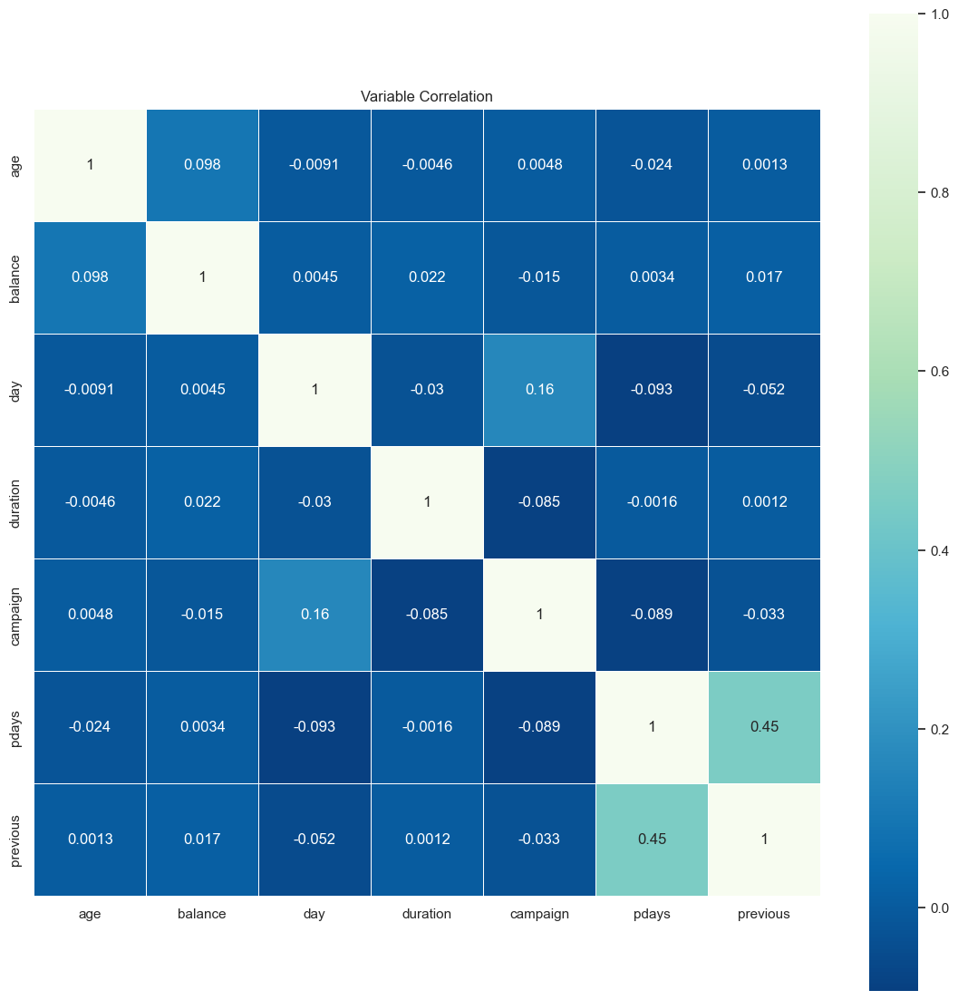

In [64]:
#Correlation Plot
plt.figure(figsize=(14,14))
sns.set(font_scale=1)
sns.heatmap(bank_original.corr(),cmap='GnBu_r',annot=True, square = True ,linewidths=.5);
plt.title('Variable Correlation')

In [82]:
bank_df2 =pd.read_csv("bank-full.csv",sep=";")
jobDummies = pd.get_dummies(bank_df2['job'], prefix = 'job')
maritalDummies = pd.get_dummies(bank_df2['marital'], prefix = 'marital')
educationDummies = pd.get_dummies(bank_df2['education'], prefix = 'education')
defaultDummies = pd.get_dummies(bank_df2['default'], prefix = 'default')
housingDummies = pd.get_dummies(bank_df2['housing'], prefix = 'housing')
loanDummies = pd.get_dummies(bank_df2['loan'], prefix = 'loan')
contactDummies = pd.get_dummies(bank_df2['contact'], prefix = 'contact')
poutcomeDummies = pd.get_dummies(bank_df2['poutcome'], prefix = 'poutcome')
bank_df2['month']=bank_df2['month'].astype('category')
bank_df2['y']=bank_df2['y'].astype('category')

# Assigning numerical values and storing in another column
bank_df2['month'] = bank_df2['month'].cat.codes
bank_df2['y'] = bank_df2['y'].cat.codes

bank_df2['y'].dtype

bank_df2["age"]=bank_df2["age"].astype("int")
bank_df2["duration"]=bank_df2["duration"].astype("int")
bank_df2["pdays"]=bank_df2["pdays"].astype("int")
bank_df2["previous"]=bank_df2["previous"].astype("int")
bank_df2["campaign"]=bank_df2["campaign"].astype("int")
bank_df2_int=bank_df2.select_dtypes(include=['int','float64','bool'])
#bank_df2_int
bank_df2=pd.concat([bank_df2_int,jobDummies,maritalDummies,educationDummies,defaultDummies,housingDummies,loanDummies
                  ,contactDummies,poutcomeDummies,bank_df2['month'],bank_df2['y']],axis=1)
bank_df2.head()

,age,balance,day,duration,campaign,pdays,previous,job_admin.,job_blue-collar,job_entrepreneur,...,loan_yes,contact_cellular,contact_telephone,contact_unknown,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown,month,y
0,58,2143,5,261,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,1,8,0
1,44,29,5,151,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,1,8,0
2,33,2,5,76,1,-1,0,0,0,1,...,1,0,0,1,0,0,0,1,8,0
3,47,1506,5,92,1,-1,0,0,1,0,...,0,0,0,1,0,0,0,1,8,0
4,33,1,5,198,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,1,8,0


In [83]:
#Variables and Output
y=np.array(bank_df2["y"])
X = bank_df2.drop("y", axis=1) #? - Quitamos la columna que queremos predecir. axis=1 para eliminar una columna, axis=0 para eliminar una fila.
sc = StandardScaler()
X_scaled = sc.fit_transform(X)


In [84]:
#Variables and Output
y=np.array(bank_df2["y"])
X=np.array(bank_df2.iloc[:,0:48])

In [85]:
#kmeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

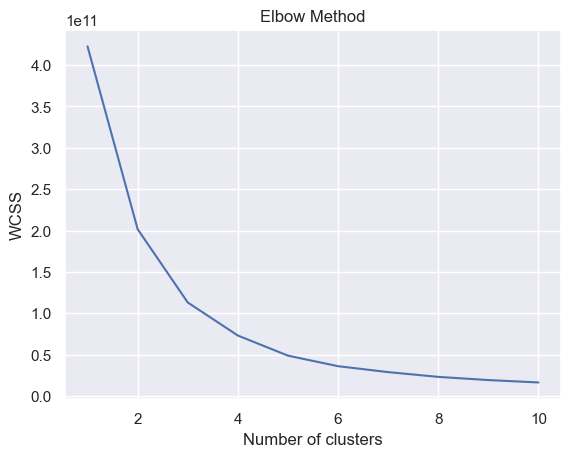

In [86]:
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [87]:
#kmeans
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

In [132]:
fig = make_subplots(rows=1, cols=1, subplot_titles=("Distribución reproducciones", "Diferencia #artistas"))

fig.add_trace(
    go.Histogram(x=bank_df['age'], color=bank_df['y'], marker_color="blue"),
    row=1, col=1
)

fig.update_layout(showlegend=False)
fig.update_xaxes(title_text="Age", row=1, col=1)
fig.update_yaxes(title_text="Count", row=1, col=1)

fig.show()




ValueError: Invalid property specified for object of type plotly.graph_objs.Histogram: 'color'

Did you mean "error_x"?

    Valid properties:
        alignmentgroup
            Set several traces linked to the same position axis or
            matching axes to the same alignmentgroup. This controls
            whether bars compute their positional range dependently
            or independently.
        autobinx
            Obsolete: since v1.42 each bin attribute is auto-
            determined separately and `autobinx` is not needed.
            However, we accept `autobinx: true` or `false` and will
            update `xbins` accordingly before deleting `autobinx`
            from the trace.
        autobiny
            Obsolete: since v1.42 each bin attribute is auto-
            determined separately and `autobiny` is not needed.
            However, we accept `autobiny: true` or `false` and will
            update `ybins` accordingly before deleting `autobiny`
            from the trace.
        bingroup
            Set a group of histogram traces which will have
            compatible bin settings. Note that traces on the same
            subplot and with the same "orientation" under `barmode`
            "stack", "relative" and "group" are forced into the
            same bingroup, Using `bingroup`, traces under `barmode`
            "overlay" and on different axes (of the same axis type)
            can have compatible bin settings. Note that histogram
            and histogram2d* trace can share the same `bingroup`
        cliponaxis
            Determines whether the text nodes are clipped about the
            subplot axes. To show the text nodes above axis lines
            and tick labels, make sure to set `xaxis.layer` and
            `yaxis.layer` to *below traces*.
        constraintext
            Constrain the size of text inside or outside a bar to
            be no larger than the bar itself.
        cumulative
            :class:`plotly.graph_objects.histogram.Cumulative`
            instance or dict with compatible properties
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        error_x
            :class:`plotly.graph_objects.histogram.ErrorX` instance
            or dict with compatible properties
        error_y
            :class:`plotly.graph_objects.histogram.ErrorY` instance
            or dict with compatible properties
        histfunc
            Specifies the binning function used for this histogram
            trace. If "count", the histogram values are computed by
            counting the number of values lying inside each bin. If
            "sum", "avg", "min", "max", the histogram values are
            computed using the sum, the average, the minimum or the
            maximum of the values lying inside each bin
            respectively.
        histnorm
            Specifies the type of normalization used for this
            histogram trace. If "", the span of each bar
            corresponds to the number of occurrences (i.e. the
            number of data points lying inside the bins). If
            "percent" / "probability", the span of each bar
            corresponds to the percentage / fraction of occurrences
            with respect to the total number of sample points
            (here, the sum of all bin HEIGHTS equals 100% / 1). If
            "density", the span of each bar corresponds to the
            number of occurrences in a bin divided by the size of
            the bin interval (here, the sum of all bin AREAS equals
            the total number of sample points). If *probability
            density*, the area of each bar corresponds to the
            probability that an event will fall into the
            corresponding bin (here, the sum of all bin AREAS
            equals 1).
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.histogram.Hoverlabel`
            instance or dict with compatible properties
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. variable `binNumber` Anything contained
            in tag `<extra>` is displayed in the secondary box, for
            example "<extra>{fullData.name}</extra>". To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Same as `text`.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        insidetextanchor
            Determines if texts are kept at center or start/end
            points in `textposition` "inside" mode.
        insidetextfont
            Sets the font used for `text` lying inside the bar.
        legendgroup
            Sets the legend group for this trace. Traces part of
            the same legend group hide/show at the same time when
            toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.histogram.Legendgrouptitle
            ` instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with `*reversed* `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        marker
            :class:`plotly.graph_objects.histogram.Marker` instance
            or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appear as the
            legend item and on hover.
        nbinsx
            Specifies the maximum number of desired bins. This
            value will be used in an algorithm that will decide the
            optimal bin size such that the histogram best
            visualizes the distribution of the data. Ignored if
            `xbins.size` is provided.
        nbinsy
            Specifies the maximum number of desired bins. This
            value will be used in an algorithm that will decide the
            optimal bin size such that the histogram best
            visualizes the distribution of the data. Ignored if
            `ybins.size` is provided.
        offsetgroup
            Set several traces linked to the same position axis or
            matching axes to the same offsetgroup where bars of the
            same position coordinate will line up.
        opacity
            Sets the opacity of the trace.
        orientation
            Sets the orientation of the bars. With "v" ("h"), the
            value of the each bar spans along the vertical
            (horizontal).
        outsidetextfont
            Sets the font used for `text` lying outside the bar.
        selected
            :class:`plotly.graph_objects.histogram.Selected`
            instance or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stream
            :class:`plotly.graph_objects.histogram.Stream` instance
            or dict with compatible properties
        text
            Sets hover text elements associated with each bar. If a
            single string, the same string appears over all bars.
            If an array of string, the items are mapped in order to
            the this trace's coordinates.
        textangle
            Sets the angle of the tick labels with respect to the
            bar. For example, a `tickangle` of -90 draws the tick
            labels vertically. With "auto" the texts may
            automatically be rotated to fit with the maximum size
            in bars.
        textfont
            Sets the text font.
        textposition
            Specifies the location of the `text`. "inside"
            positions `text` inside, next to the bar end (rotated
            and scaled if needed). "outside" positions `text`
            outside, next to the bar end (scaled if needed), unless
            there is another bar stacked on this one, then the text
            gets pushed inside. "auto" tries to position `text`
            inside the bar, but if the bar is too small and no bar
            is stacked on this one the text is moved outside. If
            "none", no text appears.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appear on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. variables `label` and `value`.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.histogram.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the sample data to be binned on the x axis.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xbins
            :class:`plotly.graph_objects.histogram.XBins` instance
            or dict with compatible properties
        xcalendar
            Sets the calendar system to use with `x` date data.
        xhoverformat
            Sets the hover text formatting rulefor `x`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `xaxis.hoverformat`.
        xsrc
            Sets the source reference on Chart Studio Cloud for
            `x`.
        y
            Sets the sample data to be binned on the y axis.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ybins
            :class:`plotly.graph_objects.histogram.YBins` instance
            or dict with compatible properties
        ycalendar
            Sets the calendar system to use with `y` date data.
        yhoverformat
            Sets the hover text formatting rulefor `y`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `yaxis.hoverformat`.
        ysrc
            Sets the source reference on Chart Studio Cloud for
            `y`.
        
Did you mean "error_x"?

Bad property path:
color
^^^^^

In [158]:
bank_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [178]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly import graph_objs as go

fig_previous_campaign_outcomes = px.pie(data, names='poutcome', title='Resultados de Campañas Previas')
fig_previous_campaign_outcomes.show()
fig = px.histogram(bank_df, x="age", color="y",
                   labels = {"streams": "Reproducciones"},
                   histnorm='probability density',
                   nbins = 100,
                   opacity=0.6)
#fig.update_traces(marker_color = "darkorange")
fig.show()
fig_balance_distribution = px.violin(bank_df, y='balance', color='y', title='Distribución del Balance')
fig_balance_distribution.show()




# Crear subplots
fig = make_subplots(rows=3, cols=2)
si = bank_df[bank_df['y'] == 'yes']



# Categorías de Trabajo con Mayor Tasa de Éxito
fig.add_trace(
    go.Bar(x=df_job_success['Job'], y=df_job_success['Count']),
    row=2, col=1
)

# Estado Civil vs Depósito
fig.add_trace(
    go.Histogram(x=bank_df['marital']),
    row=2, col=2
)
# Agrego las trazas necesarias
fig.add_trace(
    go.Bar(
        x = coefficients,
        y = objects,
        name = "Coeficientes",
        orientation='h'
    )
)



# Actualizar diseño
fig.update_layout(showlegend=False)

# Mostrar la figura
fig.show()


In [171]:
fig_scatter = px.scatter_3d(bank_df,x='age', y='balance',
                           z='campaign ', color='yes')
fig_scatter.show()

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\jbret\AppData\Roaming\Python\Python39\site-packages\IPython\core\interactiveshell.py", line 3548, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\jbret\AppData\Local\Temp\ipykernel_13284\2551151620.py", line 1, in <module>
    fig_scatter = px.scatter_3d(bank_df,x='age', y='balance',
  File "c:\Users\jbret\AppData\Local\Programs\Python\Python39\lib\site-packages\plotly\express\_chart_types.py", line 776, in scatter_3d
    width=None,
  File "c:\Users\jbret\AppData\Local\Programs\Python\Python39\lib\site-packages\plotly\express\_core.py", line 1991, in make_figure
  File "c:\Users\jbret\AppData\Local\Programs\Python\Python39\lib\site-packages\plotly\express\_core.py", line 1406, in build_dataframe
  File "c:\Users\jbret\AppData\Local\Programs\Python\Python39\lib\site-packages\plotly\express\_core.py", line 1208, in process_args_into_dataframe
ValueError: Value of 'z' is not the name of a column in 'da

Tras ver todos los estudios de regresion logistica esta claro que el banco se tiene que centrar mas en los contact unknonw ya que es la principal variable de prediccion. Por lo que un estudio y mejor obtencion de datos ayudaria a entender mejor el comportamiento de los usuarios. Tambien se deberia de enfocar en las categorias de trabajos que tiene mas exito y no dar tanto foco al resto. La duracion tambien es una variable clave aunque tiene sentido ya que habria que descartar y hacer una limpieza.

Vemos tambien la importacia del estado civil a la hora de si el cliente va a depositar.

He perdido mucho tiempo en el dash para que luego me falle :( y el subplot algunos han dado problema al tener que cambiar a go de px